In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import joblib
import os

In [ ]:
from google.colab import files
files.upload()

Saving cybersecurity_attacks.csv.csv to cybersecurity_attacks.csv.csv


{'cybersecurity_attacks.csv.csv': b'Timestamp,Source IP Address,Destination IP Address,Source Port,Destination Port,Protocol,Packet Length,Packet Type,Traffic Type,Payload Data,Malware Indicators,Anomaly Scores,Alerts/Warnings,Attack Type,Attack Signature,Action Taken,Severity Level,User Information,Device Information,Network Segment,Geo-location Data,Proxy Information,Firewall Logs,IDS/IPS Alerts,Log Source\n2023-05-30 06:33:58,103.216.15.12,84.9.164.252,31225,17616,ICMP,503,Data,HTTP,"Qui natus odio asperiores nam. Optio nobis iusto accusamus ad perferendis esse at. Asperiores neque at ad.\nMaiores possimus ipsum saepe vitae. Ad possimus veritatis.",IoC Detected,28.67,,Malware,Known Pattern B,Logged,Low,Reyansh Dugal,Mozilla/5.0 (compatible; MSIE 8.0; Windows NT 6.2; Trident/5.0),Segment A,"Jamshedpur, Sikkim",150.9.97.135,Log Data,,Server\n2020-08-26 07:08:30,78.199.217.198,66.191.137.154,17245,48166,ICMP,1174,Data,HTTP,"Aperiam quos modi officiis veritatis rem. Omnis nulla dolore p

In [ ]:

DATA_PATH = "cybersecurity_attacks.csv"
df = pd.read_csv(DATA_PATH)
print(" Dataset Loaded Successfully!")
print("Shape:", df.shape)
print(df.head())

✅ Dataset Loaded Successfully!
Shape: (40000, 25)
             Timestamp Source IP Address Destination IP Address  Source Port  \
0  2023-05-30 06:33:58     103.216.15.12           84.9.164.252        31225   
1  2020-08-26 07:08:30    78.199.217.198         66.191.137.154        17245   
2  2022-11-13 08:23:25      63.79.210.48          198.219.82.17        16811   
3  2023-07-02 10:38:46     163.42.196.10        101.228.192.255        20018   
4  2023-07-16 13:11:07     71.166.185.76        189.243.174.238         6131   

   Destination Port Protocol  Packet Length Packet Type Traffic Type  \
0             17616     ICMP            503        Data         HTTP   
1             48166     ICMP           1174        Data         HTTP   
2             53600      UDP            306     Control         HTTP   
3             32534      UDP            385        Data         HTTP   
4             26646      TCP           1462        Data          DNS   

                                    

In [ ]:
possible_targets = ['label', 'attack', 'target', 'class', 'is_attack', 'attack_type', 'Log Source']
target_col = None
for t in possible_targets:
    if t in df.columns:
        target_col = t
        break

if target_col is None:
    raise ValueError("⚠️ Please specify your target column manually, e.g. target_col = 'attack'")

print(" Target Column:", target_col)


X = df.drop(columns=[target_col])
y = df[target_col]

le = None
if y.dtype == object:
    le = LabelEncoder()
    y = le.fit_transform(y)
    print("Encoded Target Classes:", list(le.classes_))

🎯 Target Column: Log Source
Encoded Target Classes: ['Firewall', 'Server']


In [ ]:
num_imputer = SimpleImputer(strategy='median')
cat_imputer = SimpleImputer(strategy='constant', fill_value='MISSING')

preprocessor = ColumnTransformer([
    ('num', Pipeline([
        ('imputer', num_imputer),
        ('scaler', StandardScaler())
    ]), num_cols),

    ('ohe', Pipeline([
        ('imputer', cat_imputer),
        ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))
    ]), ohe_cols),

    ('ord', Pipeline([
        ('imputer', cat_imputer),
        ('ord', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
    ]), ord_cols)
])


In [ ]:

model = Pipeline([
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(
        n_estimators=200,
        class_weight='balanced',
        random_state=42,
        n_jobs=-1
    ))
])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print("Training Samples:", X_train.shape)
print("Testing Samples:", X_test.shape)


model.fit(X_train, y_train)
print(" Model Trained Successfully!")


y_pred = model.predict(X_test)
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Training Samples: (32000, 24)
Testing Samples: (8000, 24)
✅ Model Trained Successfully!

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.05      0.09      4023
           1       0.50      0.96      0.66      3977

    accuracy                           0.50      8000
   macro avg       0.53      0.50      0.37      8000
weighted avg       0.53      0.50      0.37      8000

📉 Confusion Matrix:
 [[ 195 3828]
 [ 159 3818]]


# New Section

ROC AUC Score: 0.5035350543777354


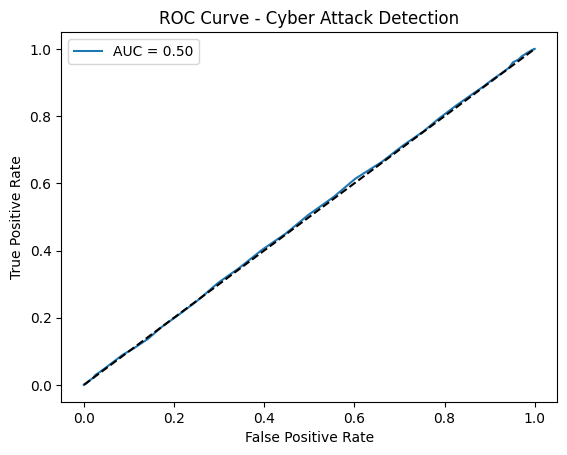

In [ ]:
if len(np.unique(y)) == 2:
    y_proba = model.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test, y_proba)
    print("ROC AUC Score:", auc)

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    plt.figure()
    plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve - Cyber Attack Detection")
    plt.legend()
    plt.show()
else:
    print("Multiclass target detected — skipping ROC AUC.")


In [ ]:
MODEL_PATH = "E:\padv\RESEARCH MODEL\cyber_attack_detector.pkl"
joblib.dump({'model': model, 'label_encoder': le}, MODEL_PATH)
print(f"💾 Model Saved Successfully as {MODEL_PATH}")

<>:1: SyntaxWarning: invalid escape sequence '\p'
<>:1: SyntaxWarning: invalid escape sequence '\p'
/tmp/ipython-input-3901260618.py:1: SyntaxWarning: invalid escape sequence '\p'
  MODEL_PATH = "E:\padv\RESEARCH MODEL\cyber_attack_detector.pkl"


💾 Model Saved Successfully as E:\padv\RESEARCH MODEL\cyber_attack_detector.pkl
